In [1]:
import torch
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from lataq.models import EMBEDCVAE

sc.settings.set_figure_params(dpi=300, frameon=False)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)
import matplotlib.pyplot as plt

import matplotlib as mpl

Global seed set to 0


In [2]:
embedding = sc.read('../data/lataq_8M_pbmc_embedding.h5ad')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [3]:
embedding

AnnData object with n_obs × n_vars = 2394 × 20
    obs: 'dataset', 'sample_ID_czi', 'subject_ID_czi', 'assay', 'batch_czi', 'development_stage', 'disease', 'sex', 'tissue', 'ethnicity', 'sample_ID_lataq', 'batch'
    uns: 'assay_colors', 'batch_colors', 'dataset_colors', 'disease_colors', 'ethnicity_colors', 'pca', 'sex_colors'
    obsm: 'X_pca'
    varm: 'PCs'

In [4]:
adata = sc.read('../data/czi_8M_PBMC_lataq_ref_10k_loSuHanifa.h5ad')

In [5]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["external_gene_name", "ensembl_gene_id"],
    ).set_index("ensembl_gene_id")
adata.var[annot.columns] = annot

In [6]:
adata.var.drop_duplicates(subset='external_gene_name')

,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,external_gene_name
ENSG00000000419,True,4431.0,0.106416,0.126012,0.931876,7,DPM1
ENSG00000000938,True,1467.0,0.533028,1.716957,1.268582,20,FGR
ENSG00000000971,True,2477.0,0.014097,0.019168,1.130235,23,CFH
ENSG00000001036,True,4463.0,0.090884,0.126025,1.004677,18,FUCA2
ENSG00000001461,True,4491.0,0.083939,0.100602,0.924543,5,NIPAL3
...,...,...,...,...,...,...,...
ENSG00000287080,True,3466.0,0.005464,0.141816,0.861774,3,H3C3
ENSG00000287148,True,4802.0,0.000001,0.000001,0.082481,1,LINCADL
ENSG00000287736,True,2239.0,0.003427,0.004111,0.084150,1,PTCSC1
ENSG00000288611,True,3921.0,0.000024,0.000026,0.042244,1,NPBWR1


In [7]:
adata = adata[:, adata.var.drop_duplicates(subset='external_gene_name').index]

In [8]:
adata = adata[:, ~(adata.var['external_gene_name']).isna()]
adata

View of AnnData object with n_obs × n_vars = 7488361 × 8456
    obs: 'dataset', 'sample_ID_czi', 'subject_ID_czi', 'cell_type_ontology_term_id', 'cell_type', 'total_counts_lisa', 'batch_czi', 'assay_ontology_term_id', 'assay', 'development_stage_ontology_term_id', 'development_stage', 'disease_ontology_term_id', 'disease', 'ethnicity_ontology_term_id', 'ethnicity', 'organism_ontology_term_id', 'organism', 'sex_ontology_term_id', 'sex', 'tissue_ontology_term_id', 'tissue', 'cell_type_for_integration', 'sample_ID_lataq'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'external_gene_name'
    uns: 'hvg'

In [9]:
adata.var_names = adata.var['external_gene_name']

In [99]:
mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
ribo_gene_mask = [(gene.startswith('RPL') or gene.startswith('RPS')) for gene in adata.var_names]

adata.obs['ribo_frac'] = (
    np.asarray(
        adata
        .X[:, np.flatnonzero(ribo_gene_mask)]
        .sum(1)
    )
    .flatten()
    / adata.obs['total_counts_lisa']
)

adata.obs['mt_frac'] = (
    np.asarray(
        adata
        .X[:, np.flatnonzero(mt_gene_mask)]
        .sum(1)
    )
    .flatten()
    / adata.obs['total_counts_lisa']
)

In [100]:
embedding.obs['avg_counts'] = adata.obs.groupby('sample_ID_lataq')['total_counts_lisa'].mean()

In [101]:
embedding.obs['ribo_frac'] = adata.obs.groupby('sample_ID_lataq')['ribo_frac'].mean()
embedding.obs['mt_frac'] = adata.obs.groupby('sample_ID_lataq')['mt_frac'].mean()

In [102]:
embedding.obs['log_avg_counts'] = np.log(adata.obs.groupby('sample_ID_lataq')['total_counts_lisa'].mean())

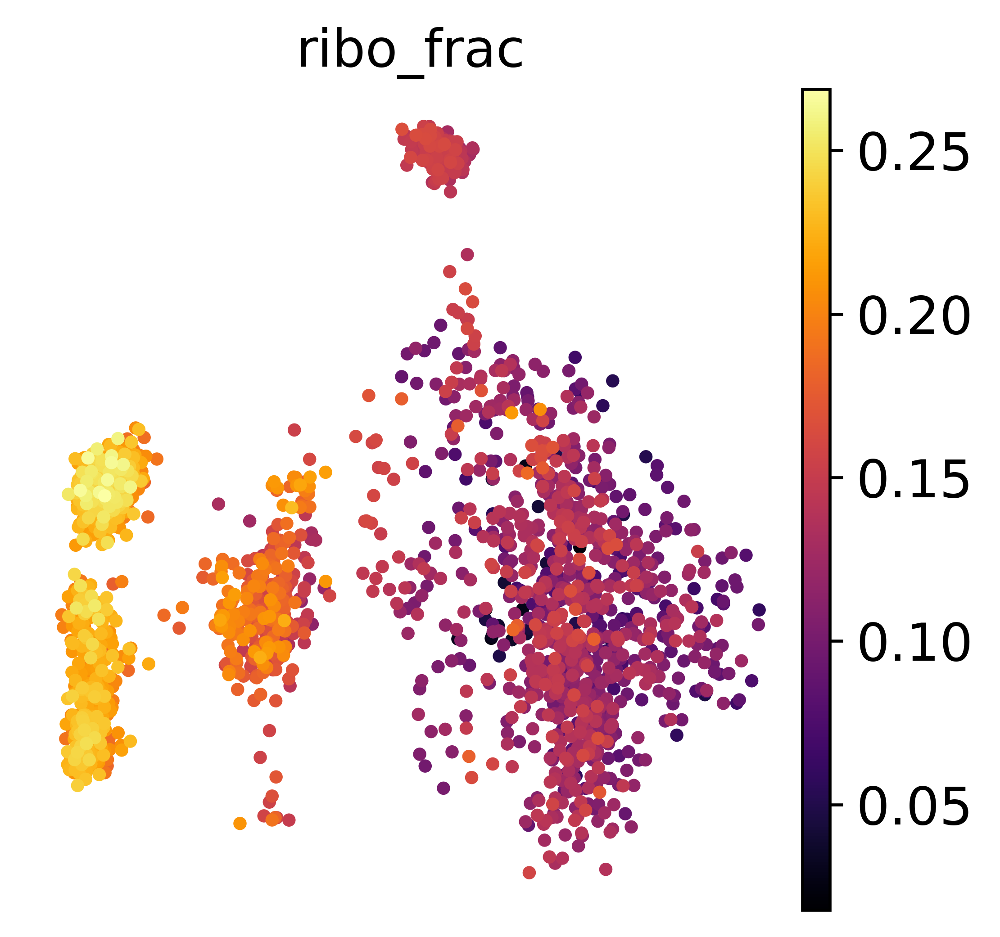

In [103]:
sc.pl.pca(embedding, color='ribo_frac', components=[1, 2], cmap='inferno')

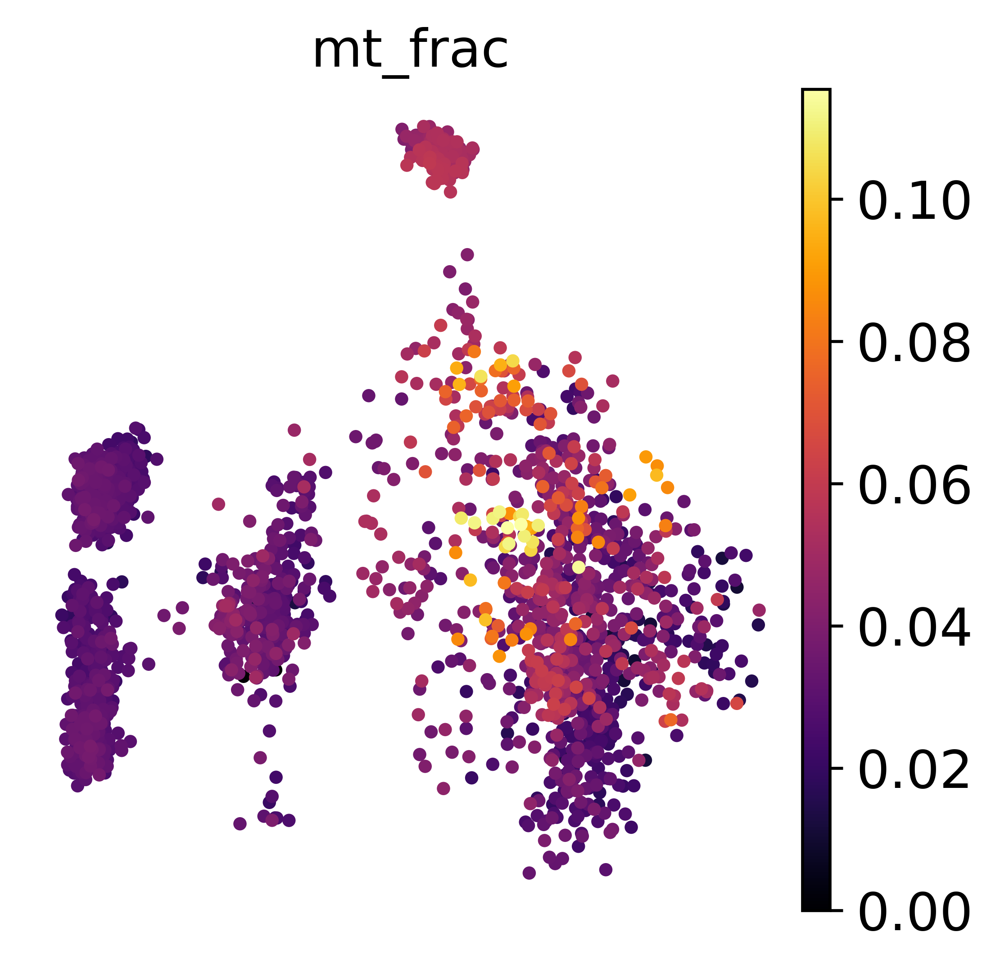

In [104]:
sc.pl.pca(embedding, color='mt_frac', components=[1, 2], cmap='inferno')

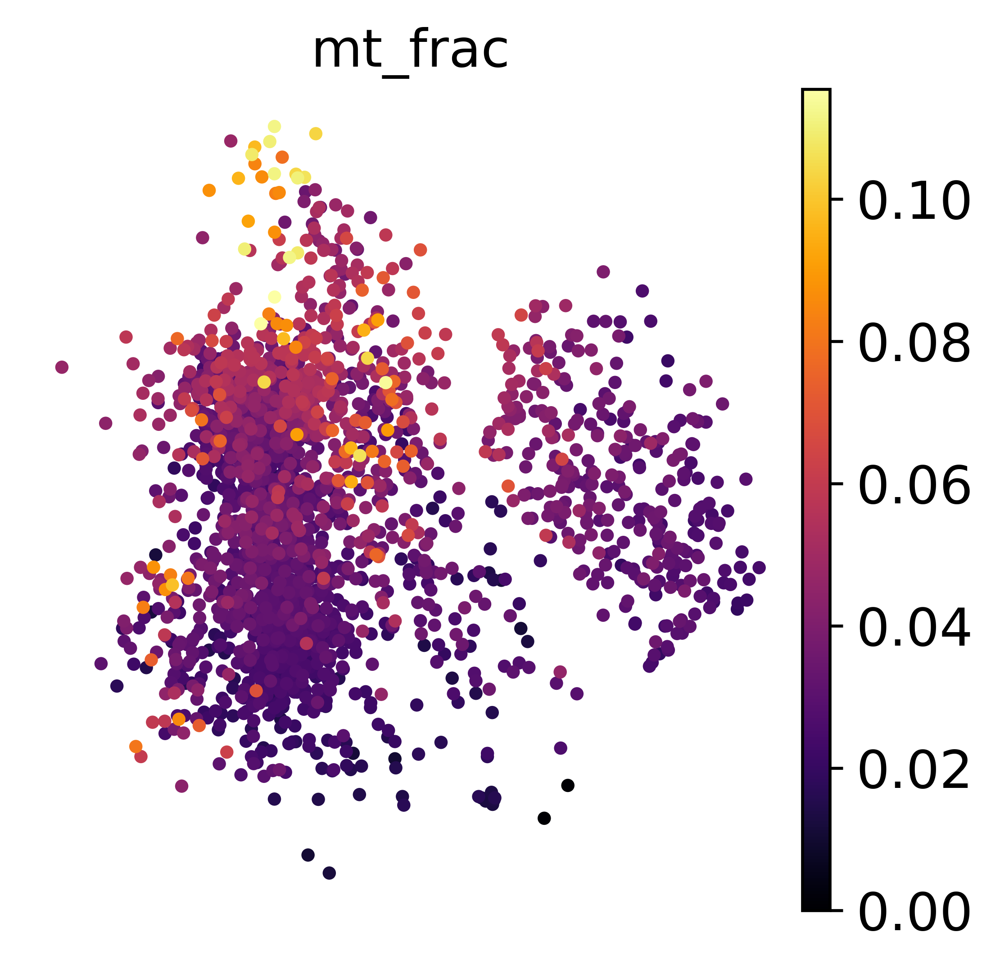

In [105]:
sc.pl.pca(embedding, color='mt_frac', components=[3, 4], cmap='inferno')

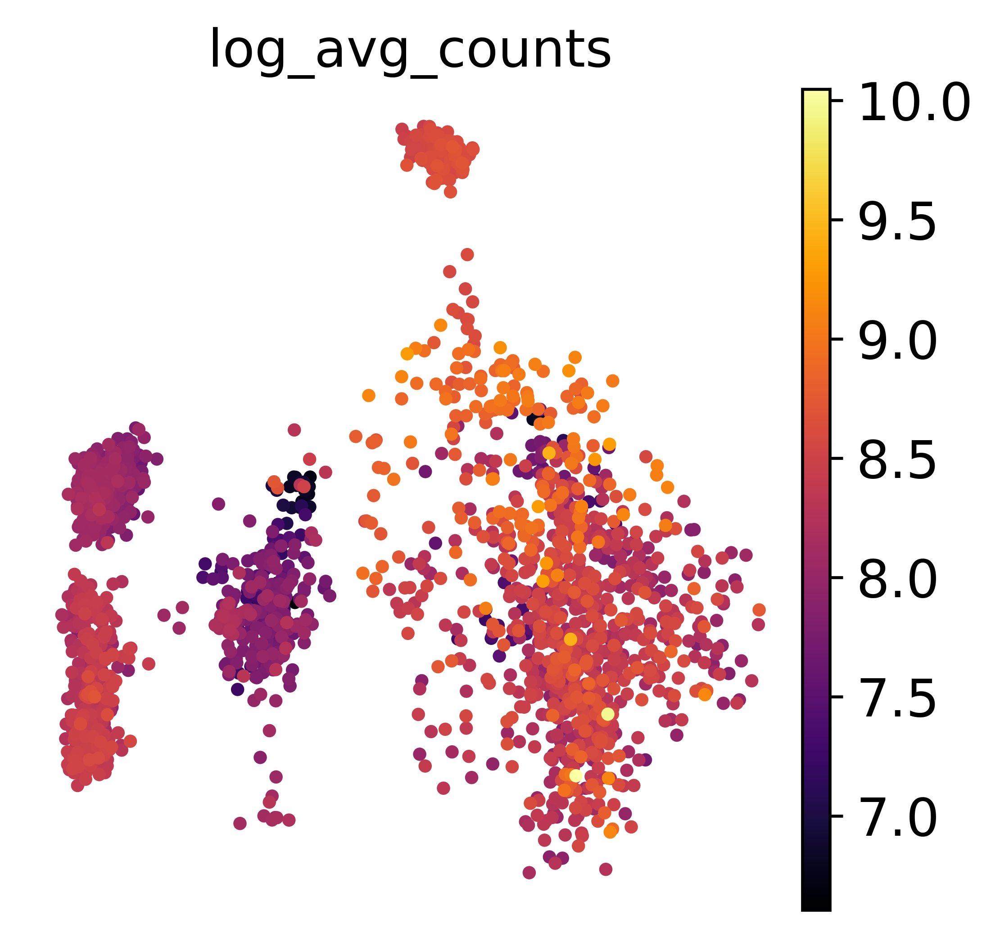

In [12]:
sc.pl.pca(embedding, color='log_avg_counts', components=[1, 2], cmap='inferno')

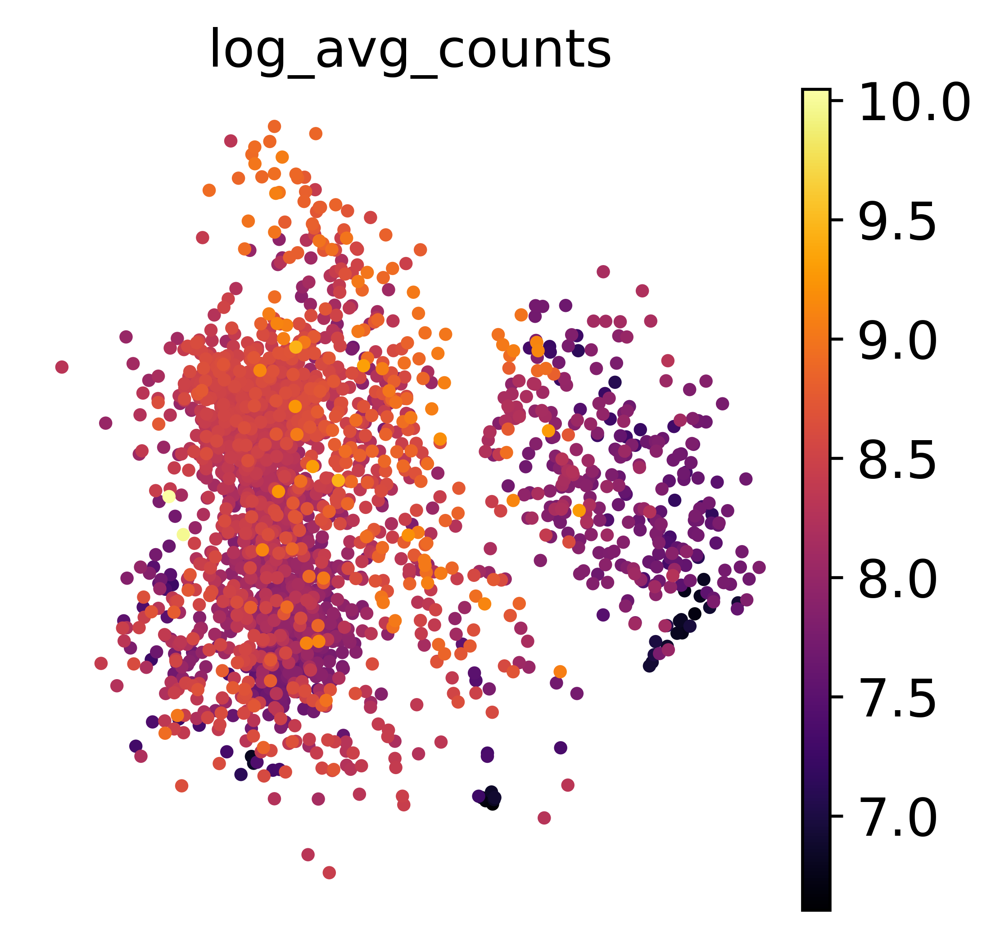

In [13]:
sc.pl.pca(embedding, color='log_avg_counts', components=[3, 4], cmap='inferno')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


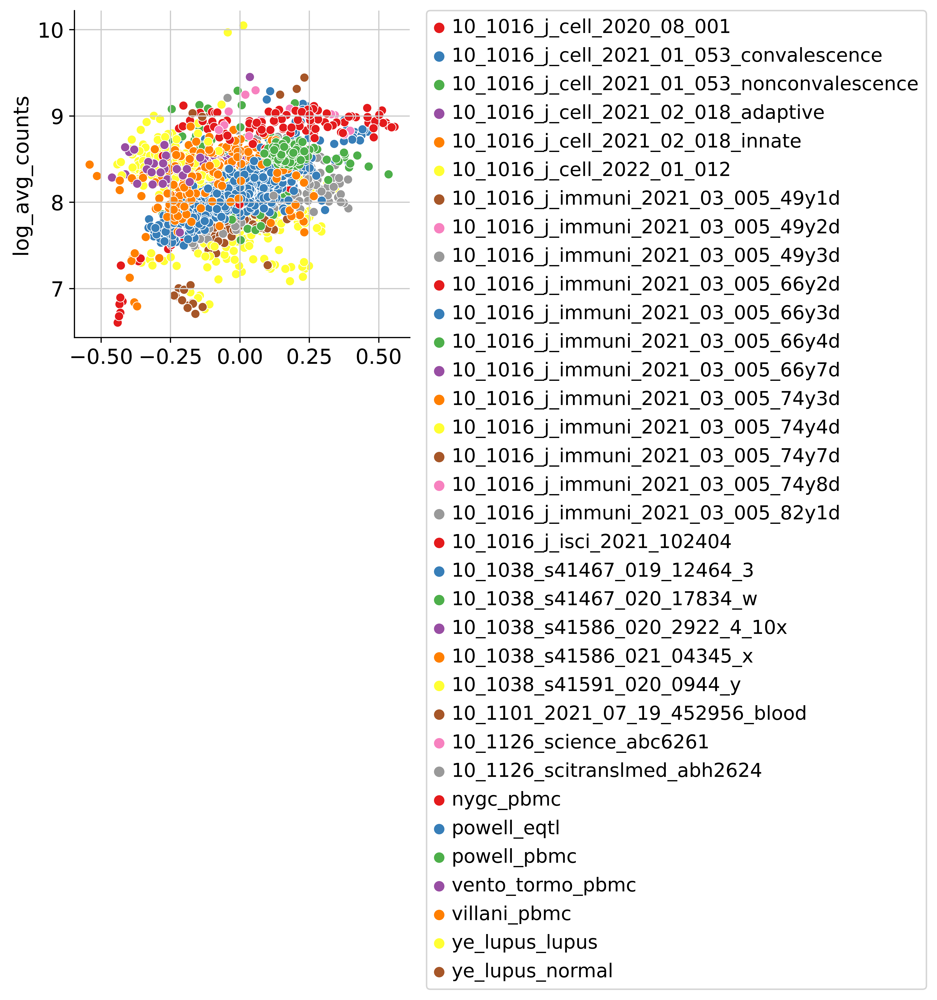

In [14]:
fig, ax = plt.subplots(1, 1)
sns.scatterplot(
    embedding.obsm['X_pca'][:, 3], 
    embedding.obs['log_avg_counts'], 
    hue=embedding.obs['dataset'],
    ax=ax,
    palette='Set1'
)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine()

In [15]:
from scipy.stats import pearsonr

In [16]:
pearsonr(embedding.obs['log_avg_counts'], embedding.obsm['X_pca'][:, 3],)

(0.41880671754487764, 2.613742964832718e-102)

In [17]:
ct_counts = pd.DataFrame(adata.obs.groupby('sample_ID_lataq')['cell_type_for_integration'].value_counts())
ct_counts['ct'] =  ct_counts.index.get_level_values(1)
ct_counts.index = ct_counts.index.droplevel(1)
ct_counts['total'] = adata.obs.groupby('sample_ID_lataq').size().reindex(ct_counts.index)
ct_counts['proportion'] = ct_counts['cell_type_for_integration'] / ct_counts['total']

In [18]:
p_table = pd.pivot_table(ct_counts, index='sample_ID_lataq', columns='ct', values='proportion')
p_table = p_table.fillna(0)

In [19]:
for col in p_table.columns:
    embedding.obs[col] = p_table[col]

In [20]:
from sklearn.decomposition import PCA
pca = PCA(n_components=5)
ct_prop_pca = pca.fit_transform(p_table.values)

In [21]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=0).fit(ct_prop_pca)

In [22]:
embedding.obs['ct_clusters'] = kmeans.labels_
embedding.obs['ct_clusters'] = embedding.obs['ct_clusters'].astype('category')

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


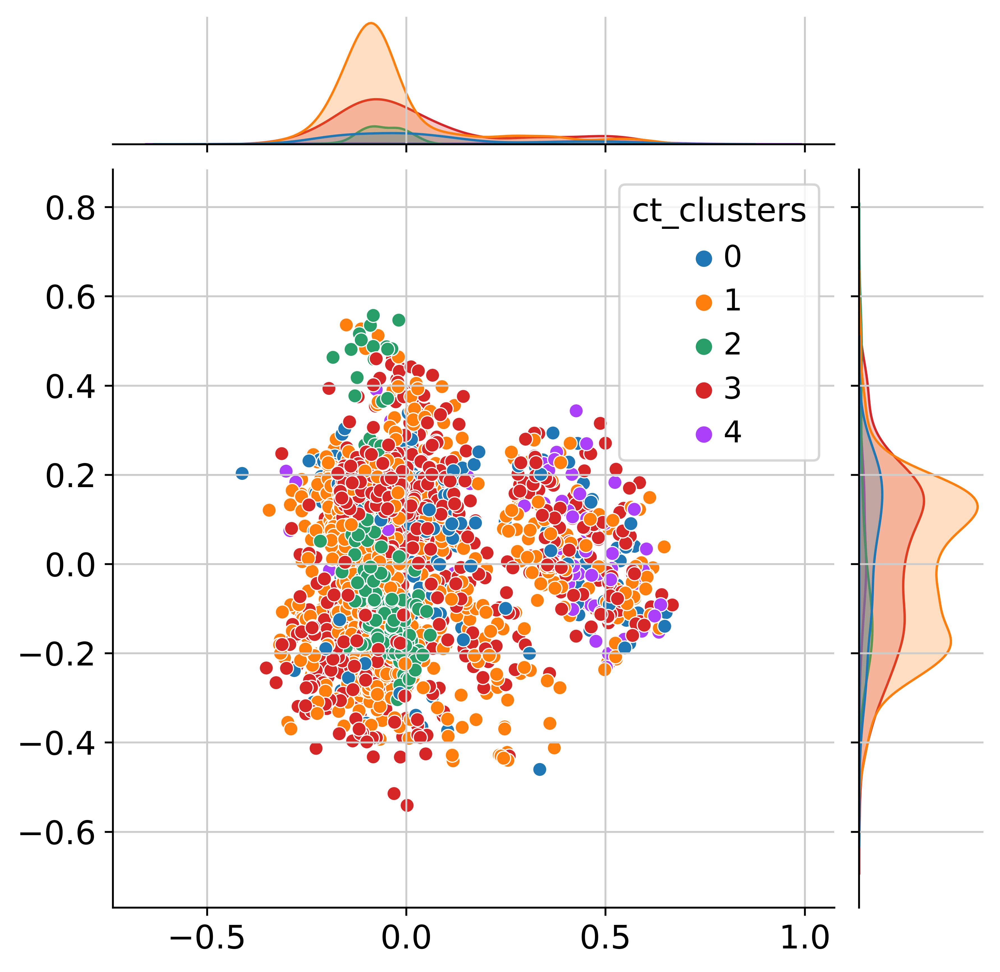

In [23]:
sns.jointplot(embedding.obsm['X_pca'][:, 2], embedding.obsm['X_pca'][:, 3], hue=embedding.obs['ct_clusters'])

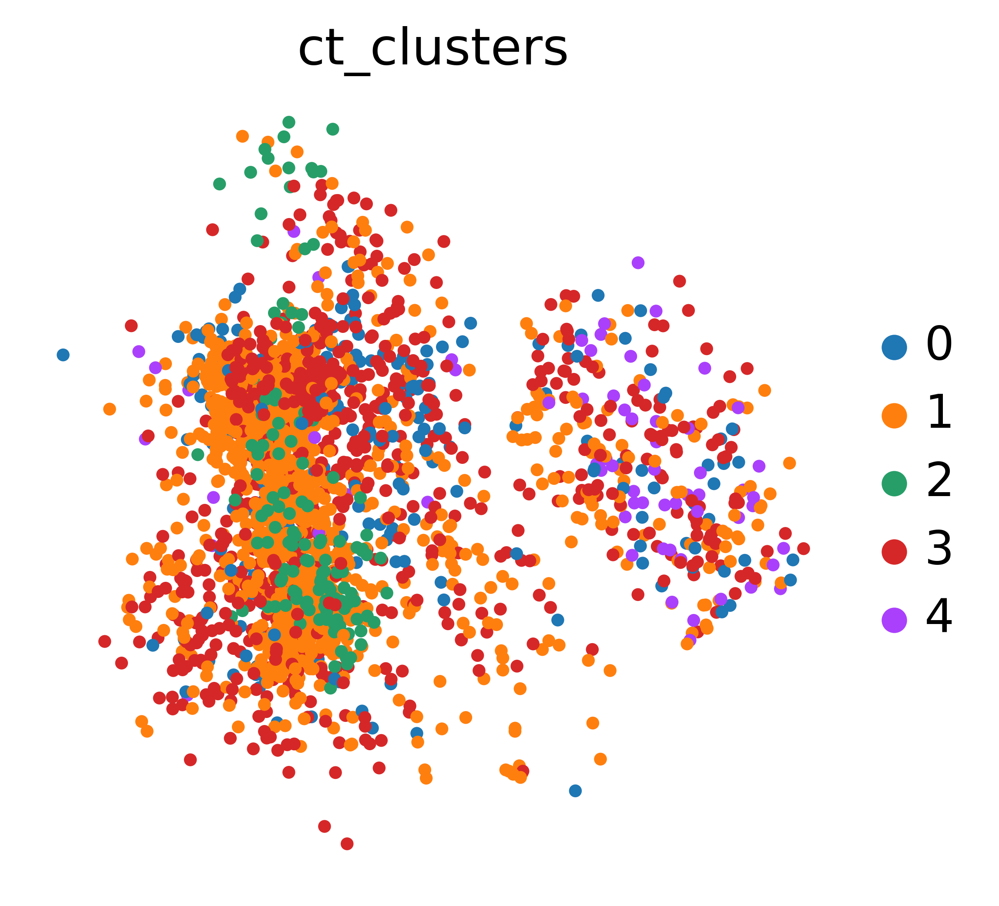

In [24]:
sc.pl.pca(embedding, color='ct_clusters', components=[3, 4])

In [25]:
from tqdm import tqdm
def get_mean_gexp(adata, condition):
    series_list = []
    for cond in tqdm(adata.obs[condition].cat.categories):
        mean_gexp = pd.DataFrame(
            np.squeeze(np.asarray(adata[adata.obs[condition] == cond].X.mean(0))), 
                       index=adata.var_names, columns=[cond]
            )
        series_list.append(mean_gexp)
    return series_list

In [26]:
df = get_mean_gexp(adata, 'sample_ID_lataq')

100%|██████████| 2394/2394 [02:07<00:00, 18.81it/s]


In [27]:
for i in range(len(df)):
    df[i] = df[i].T

In [28]:
mean_gexp = pd.concat(df)

In [29]:
embedding.obs = pd.concat([embedding.obs, mean_gexp], axis=1)

In [72]:
gene_corr = {}
for gene in adata.var_names:
    gene_corr[gene], _ = pearsonr(embedding.obsm['X_pca'][:, 0], embedding.obs[gene])

In [73]:
pd.Series(gene_corr).sort_values()

RPL36A    -0.831879
RPL31     -0.829523
RPS17     -0.824843
CXorf65   -0.819267
SPTBN2    -0.812502
             ...   
SSH2       0.766887
CHIC2      0.769017
RHOA       0.775399
ARIH2      0.795241
PLAA       0.813993
Length: 8456, dtype: float64

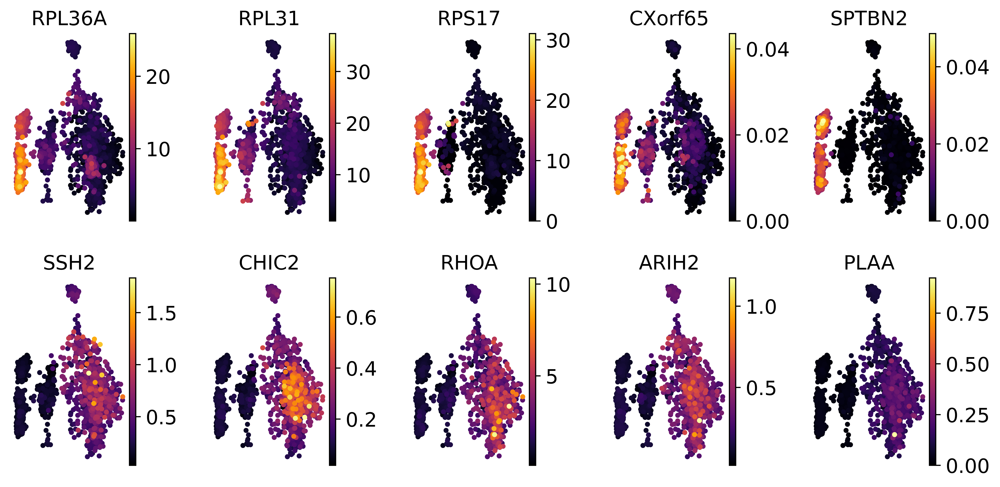

In [80]:
fig, ax = plt.subplots(2, 5, figsize=(10, 5))
genes = pd.Series(gene_corr).sort_values()
for i, gene in enumerate(genes.index[:5]):
    sc.pl.pca(embedding, color=[gene], components=[1, 2], cmap='inferno', ax=ax[0, i], show=False)
for i, gene in enumerate(genes.index[-5:]):
    sc.pl.pca(embedding, color=[gene], components=[1, 2], cmap='inferno', ax=ax[1, i], show=False)
fig.tight_layout()

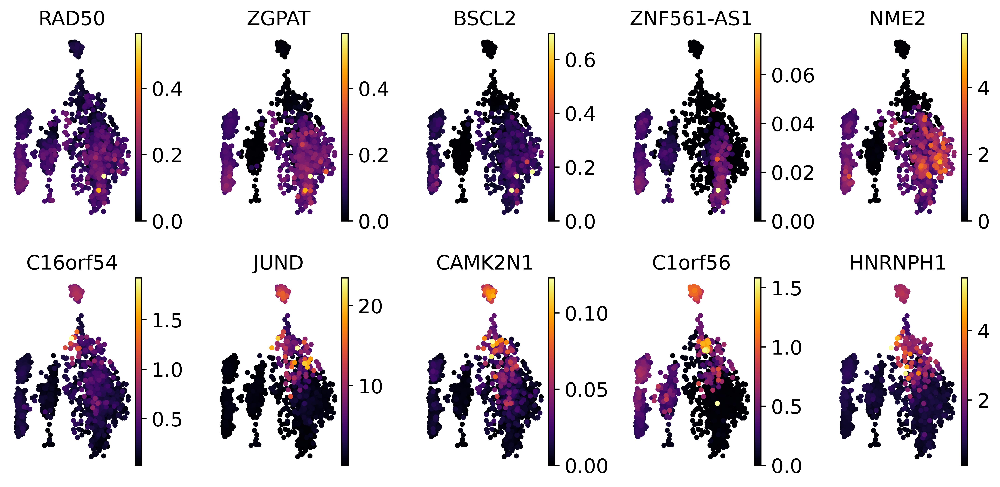

In [83]:
gene_corr = {}
for gene in adata.var_names:
    gene_corr[gene], _ = pearsonr(embedding.obsm['X_pca'][:, 1], embedding.obs[gene])
    
genes = pd.Series(gene_corr).sort_values()
fig, ax = plt.subplots(2, 5, figsize=(10, 5))

for i, gene in enumerate(genes.index[:5]):
    sc.pl.pca(embedding, color=[gene], components=[1, 2], cmap='inferno', ax=ax[0, i], show=False)
for i, gene in enumerate(genes.index[-5:]):
    sc.pl.pca(embedding, color=[gene], components=[1, 2], cmap='inferno', ax=ax[1, i], show=False)
fig.tight_layout()

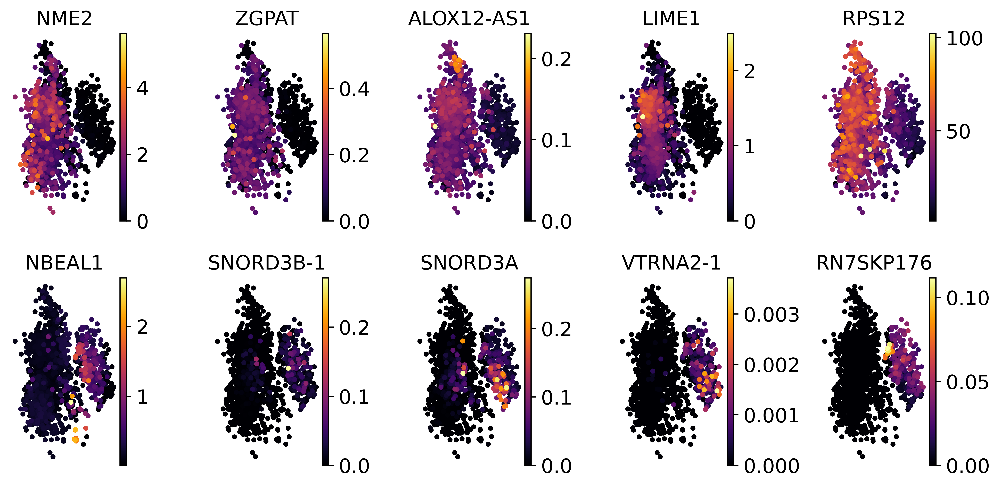

In [84]:
gene_corr = {}
for gene in adata.var_names:
    gene_corr[gene], _ = pearsonr(embedding.obsm['X_pca'][:, 2], embedding.obs[gene])
    
genes = pd.Series(gene_corr).sort_values()
fig, ax = plt.subplots(2, 5, figsize=(10, 5))

for i, gene in enumerate(genes.index[:5]):
    sc.pl.pca(embedding, color=[gene], components=[3, 4], cmap='inferno', ax=ax[0, i], show=False)
for i, gene in enumerate(genes.index[-5:]):
    sc.pl.pca(embedding, color=[gene], components=[3, 4], cmap='inferno', ax=ax[1, i], show=False)
fig.tight_layout()

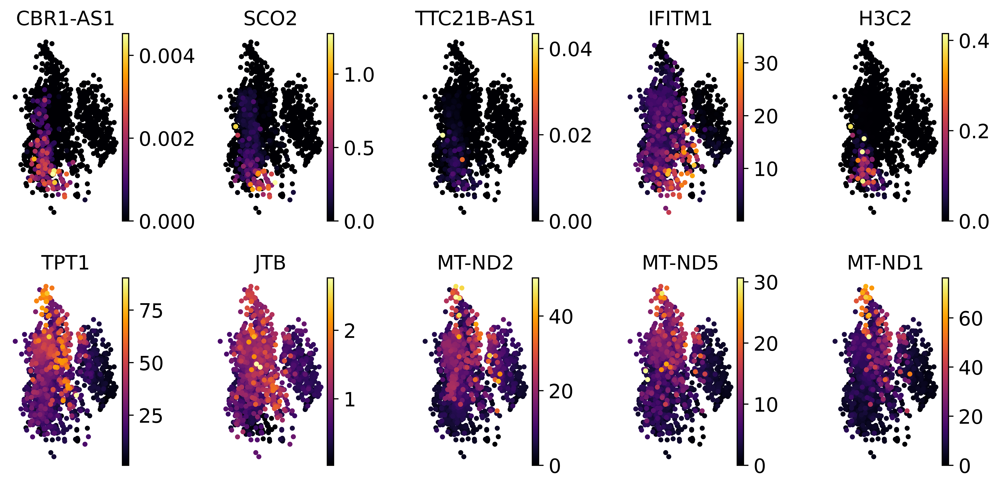

In [ ]:
gene_corr = {}
for gene in adata.var_names:
    gene_corr[gene], _ = pearsonr(embedding.obsm['X_pca'][:, 3], embedding.obs[gene])
    
genes = pd.Series(gene_corr).sort_values()
fig, ax = plt.subplots(2, 5, figsize=(10, 5))

for i, gene in enumerate(genes.index[:5]):
    sc.pl.pca(embedding, color=[gene], components=[3, 4], cmap='inferno', ax=ax[0, i], show=False)
for i, gene in enumerate(genes.index[-5:]):
    sc.pl.pca(embedding, color=[gene], components=[3, 4], cmap='inferno', ax=ax[1, i], show=False)
fig.tight_layout()

In [ ]:
embeddings_powell = embedding[embedding.obs['dataset'].str.contains('powell_eqtl')]

In [92]:
gene_corr = {}
for gene in adata.var_names:
    gene_corr[gene], _ = pearsonr(embeddings_powell.obsm['X_pca'][:, 0], embeddings_powell.obs[gene])
genes = pd.Series(gene_corr).dropna().sort_values()

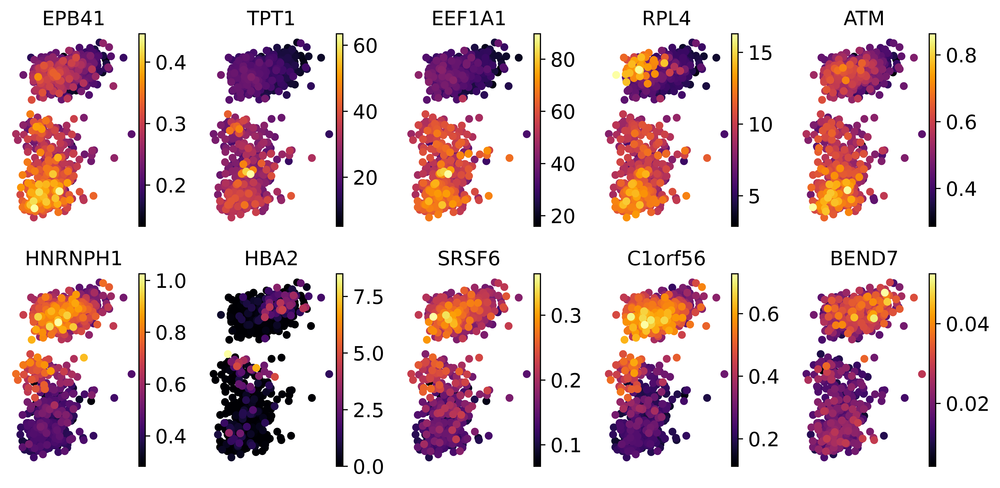

In [93]:
fig, ax = plt.subplots(2, 5, figsize=(10, 5))
for i, gene in enumerate(genes.index[:5]):
    sc.pl.pca(embeddings_powell, color=[gene], components=[1, 2], cmap='inferno', ax=ax[0, i], show=False)
for i, gene in enumerate(genes.index[-5:]):
    sc.pl.pca(embeddings_powell, color=[gene], components=[1, 2], cmap='inferno', ax=ax[1, i], show=False)
fig.tight_layout()